In [15]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG16
from tensorflow.keras import models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

In [16]:
model = VGG16(weights='imagenet', include_top=False)

In [17]:
for layer in model.layers:
    print(layer.name)

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool


In [18]:
initial_layer_names = ['block1_conv1', 'block1_conv2'] 
initial_layer_outputs = [model.get_layer(name).output for name in initial_layer_names]

In [19]:
activation_model = models.Model(inputs=model.input, outputs=initial_layer_outputs)

In [20]:
def visualize_feature_maps(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor = preprocess_input(img_tensor)
    activations = activation_model.predict(img_tensor)
    for i, activation in enumerate(activations):
        num_filters = activation.shape[-1]
        rows = (num_filters // 8) + 1
        fig, ax = plt.subplots(rows, 8, figsize=(16, rows * 2))
        for j in range(num_filters):
            ax[j // 8, j % 8].imshow(activation[0, :, :, j], cmap='viridis')
            ax[j // 8, j % 8].axis('off')
        plt.tight_layout()
        plt.show()

1/1 [==============================] - 0s 57ms/step


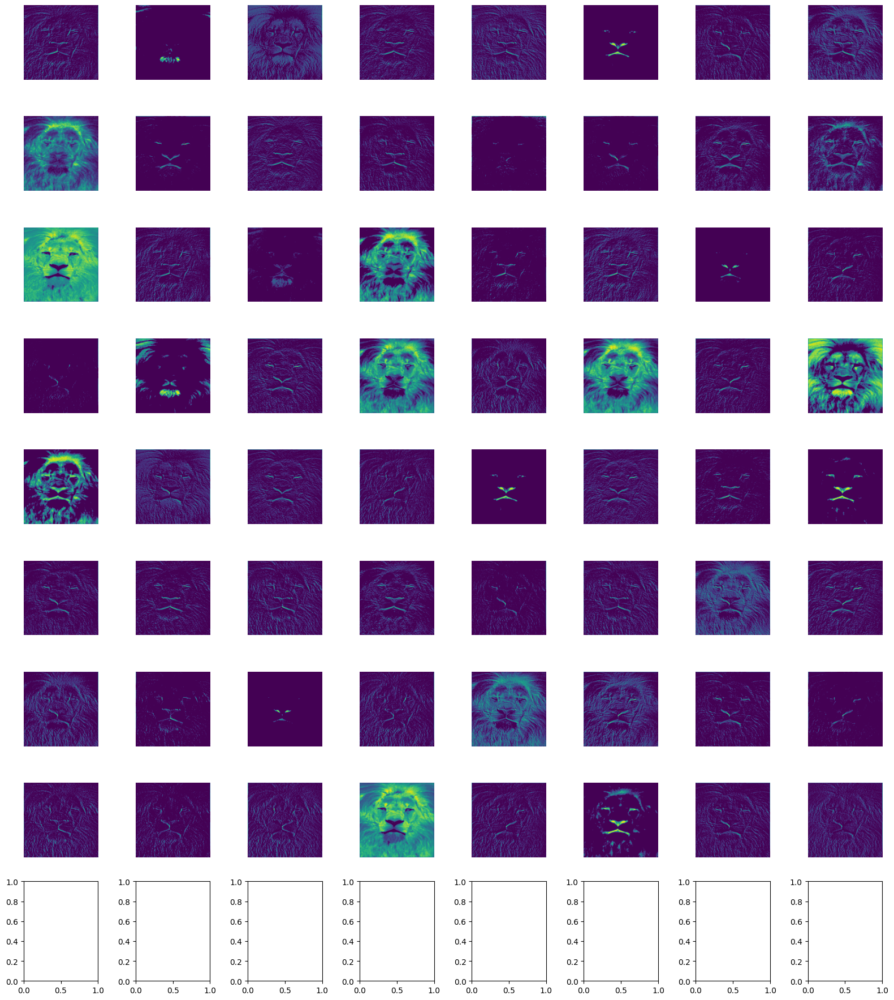

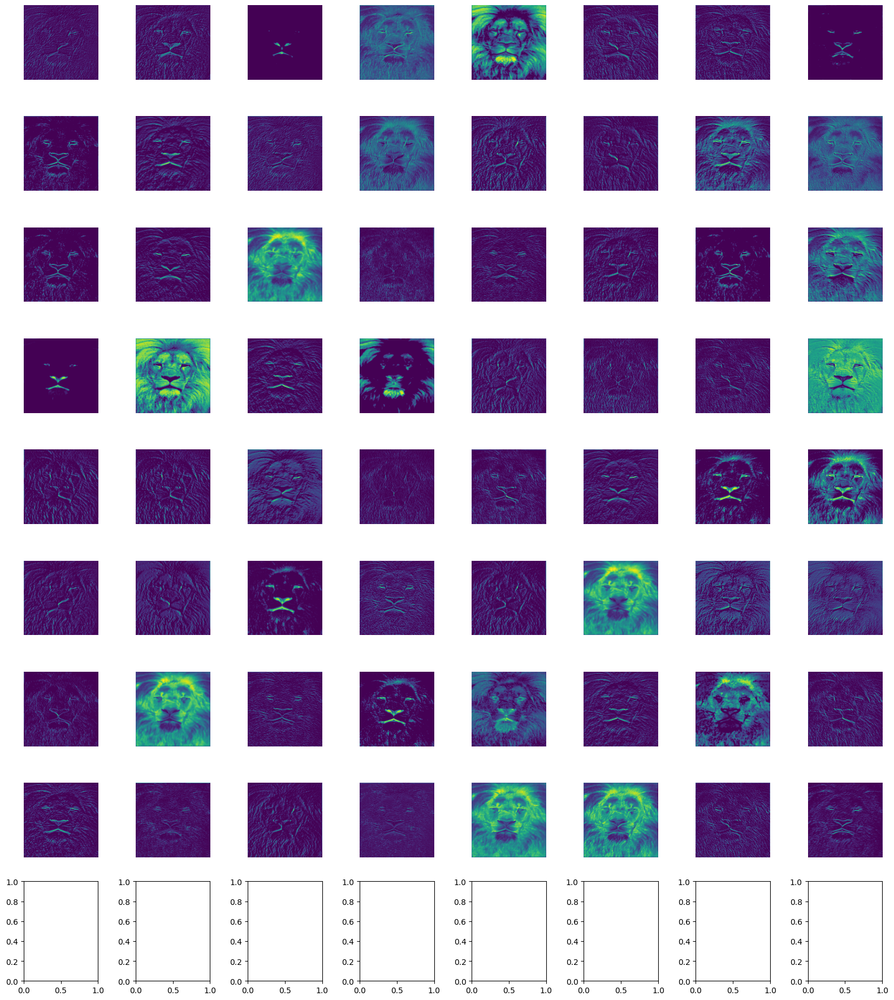

In [21]:
image_path = 'Images/pexels-public-domain-pictures-41315.jpg'  # Replace with the path to your image
visualize_feature_maps(image_path)

In [22]:
layer_name = 'block1_conv1'
selected_layer = model.get_layer(layer_name)
selected_layer_output = selected_layer.output

In [23]:
activation_model = models.Model(inputs=model.input, outputs=selected_layer_output)

In [25]:
def visualize_feature_maps(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor = preprocess_input(img_tensor)
    activation = activation_model.predict(img_tensor)
    num_filters = activation.shape[-1]
    rows = (num_filters // 8) + 1
    fig, ax = plt.subplots(rows, 8, figsize=(16, rows * 2))
    for i in range(num_filters):
        ax[i // 8, i % 8].imshow(activation[0, :, :, i], cmap='viridis')
        ax[i // 8, i % 8].axis('off')
    plt.tight_layout()
    plt.show()

In [28]:
def visualize_filters(layer_name, num_filters=16, figsize=(10, 10)):
    filters = model.get_layer(layer_name).get_weights()[0]
    num_cols = 4
    num_rows = num_filters // num_cols + 1
    fig, ax = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=figsize)
    for i in range(num_rows):
        for j in range(num_cols):
            if i * num_cols + j < num_filters:
                ax[i, j].imshow(filters[:, :, 0, i * num_cols + j], cmap='viridis')
                ax[i, j].axis('off')
            else:
                ax[i, j].axis('off')
    plt.tight_layout()
    plt.show()

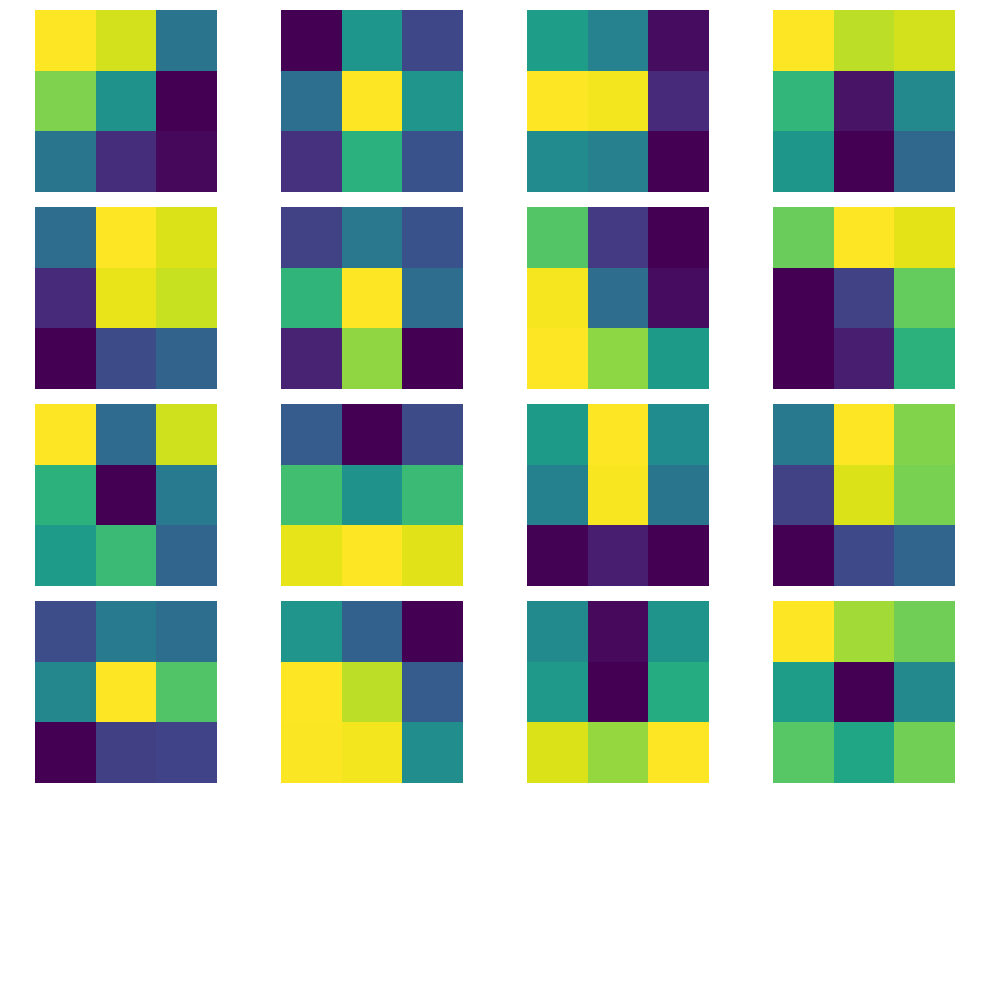

In [29]:
visualize_filters(layer_name)

1/1 [==============================] - 0s 30ms/step


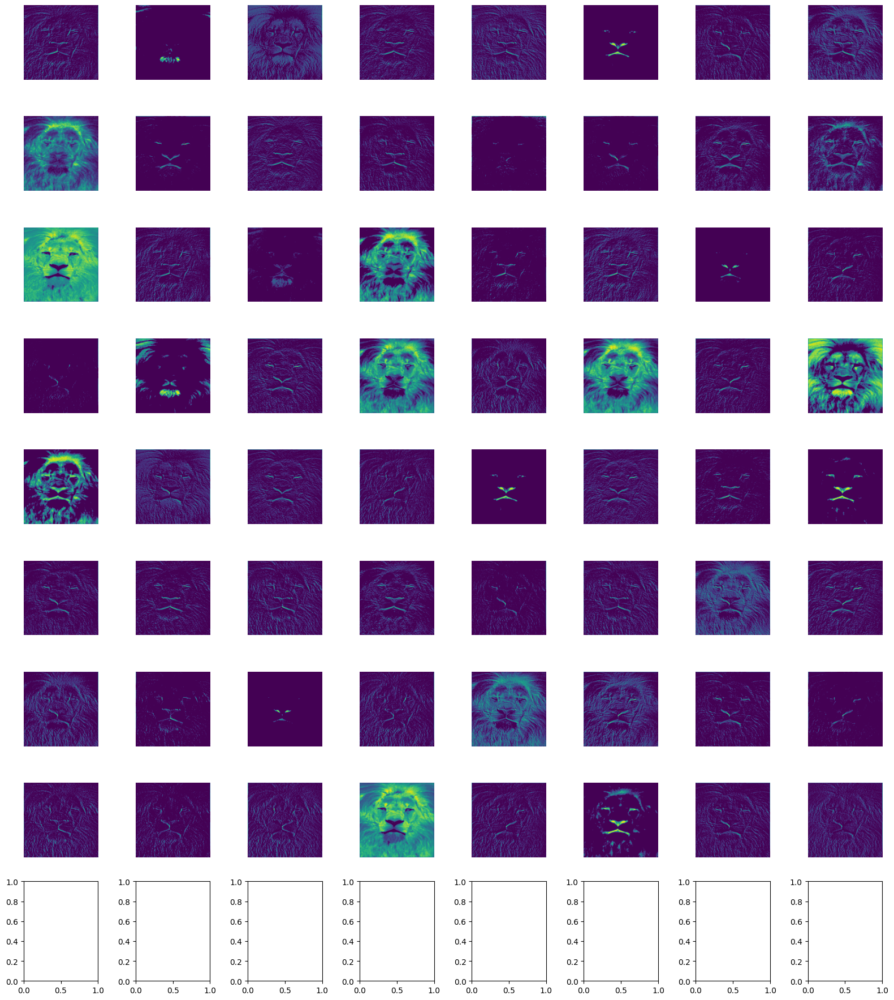

In [30]:
image_path = 'Images/pexels-public-domain-pictures-41315.jpg'  # Replace with the path to your image
visualize_feature_maps(image_path)

1/1 [==============================] - 0s 31ms/step


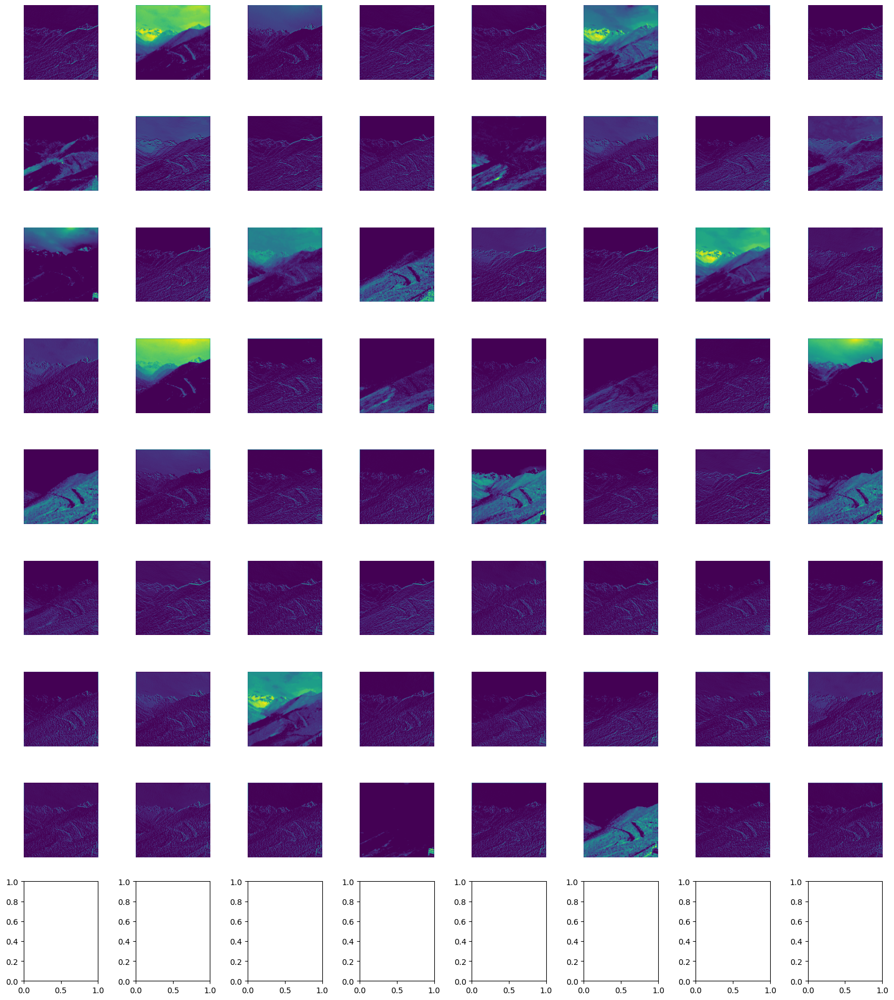

In [31]:
image_path2 = 'Images/IMG_20210704_181247.jpg'  # Replace with the path to your image
visualize_feature_maps(image_path2)